In [1]:
import pandas as pd
import pandas_profiling
import missingno as msno
import plotly.figure_factory as ff
import plotly.graph_objects as go
import plotly_express as px

%matplotlib inline
pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', None)
pd.set_option('display.max_colwidth', None)

# Dados Sinan

In [2]:
df = pd.read_csv('./../data/raw_data/2. SINAN (violencia sexual)/DadosViolSexualDomestica_2013-18_SINAN.csv', low_memory=False)

In [3]:
df.shape

(1515419, 158)

In [4]:
df.head()

,TP_NOT,ID_AGRAVO,DT_NOTIFIC,SEM_NOT,NU_ANO,SG_UF_NOT,ID_MUNICIP,TP_UNI_EXT,NM_UNI_EXT,CO_UNI_EXT,ID_UNIDADE,ID_REGIONA,ID_RG_RESI,DT_OCOR,SEM_PRI,DT_NASC,NU_IDADE_N,CS_SEXO,CS_GESTANT,CS_RACA,CS_ESCOL_N,SG_UF,ID_MN_RESI,ID_PAIS,NDUPLIC,DT_INVEST,ID_OCUPA_N,SIT_CONJUG,DEF_TRANS,DEF_FISICA,DEF_MENTAL,DEF_VISUAL,DEF_AUDITI,TRAN_MENT,TRAN_COMP,DEF_OUT,DEF_ESPEC,SG_UF_OCOR,ID_MN_OCOR,HORA_OCOR,LOCAL_OCOR,LOCAL_ESPE,OUT_VEZES,LES_AUTOP,VIOL_FISIC,VIOL_PSICO,VIOL_TORT,VIOL_SEXU,VIOL_TRAF,VIOL_FINAN,VIOL_NEGLI,VIOL_INFAN,VIOL_LEGAL,VIOL_OUTR,VIOL_ESPEC,AG_FORCA,AG_ENFOR,AG_OBJETO,AG_CORTE,AG_QUENTE,AG_ENVEN,AG_FOGO,AG_AMEACA,AG_OUTROS,AG_ESPEC,SEX_ASSEDI,SEX_ESTUPR,SEX_PUDOR,SEX_PORNO,SEX_EXPLO,SEX_OUTRO,SEX_ESPEC,PEN_ORAL,PEN_ANAL,PEN_VAGINA,PROC_DST,PROC_HIV,PROC_HEPB,PROC_SANG,PROC_SEMEN,PROC_VAGIN,PROC_CONTR,PROC_ABORT,CONS_ABORT,CONS_GRAV,CONS_DST,CONS_SUIC,CONS_MENT,CONS_COMP,CONS_ESTRE,CONS_OUTR,CONS_ESPEC,LESAO_NAT,LESAO_ESPE,LESAO_CORP,NUM_ENVOLV,REL_SEXUAL,REL_PAI,REL_MAE,REL_PAD,REL_CONJ,REL_EXCON,REL_NAMO,REL_EXNAM,REL_FILHO,REL_DESCO,REL_IRMAO,REL_CONHEC,REL_CUIDA,REL_PATRAO,REL_INST,REL_POL,REL_PROPRI,REL_OUTROS,REL_ESPEC,AUTOR_SEXO,AUTOR_ALCO,ENC_SAUDE,ENC_TUTELA,ENC_VARA,ENC_ABRIGO,ENC_SENTIN,ENC_DEAM,ENC_DPCA,ENC_DELEG,ENC_MPU,ENC_MULHER,ENC_CREAS,ENC_IML,ENC_OUTR,ENC_ESPEC,REL_TRAB,REL_CAT,CIRC_LESAO,CLASSI_FIN,EVOLUCAO,DT_OBITO,REL_MAD,TPUNINOT,ORIENT_SEX,IDENT_GEN,VIOL_MOTIV,CICL_VID,REDE_SAU,ASSIST_SOC,REDE_EDUCA,ATEND_MULH,CONS_TUTEL,CONS_IDO,DELEG_IDOS,DIR_HUMAN,MPU,DELEG_CRIA,DELEG_MULH,DELEG,INFAN_JUV,DEFEN_PUBL,DT_ENCERRA
0,2,Y09,2013-01-02,NaN,NaN,12,120040,NaN,NaN,NaN,2000733.0,1938.0,1938.0,2013-01-02,NaN,1998-02-09,4014.0,F,5.0,4.0,3.0,12,120040,1.0,NaN,NaN,NaN,2.0,2,8.0,8.0,8.0,8.0,8.0,8.0,8.0,NaN,12.0,120040.0,NaN,1.0,NaN,1.0,1,2,2,2,1,2,2,2,2,2,2,NaN,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,NaN,2,2,2,2,2,2,NaN,2,2,1,2,2,2,2,2,2,2,2,2.0,2,2,2,2,2,2,2,NaN,88.0,NaN,88.0,1.0,1.0,2,2,2,2,2,1,2,2,2,2,2,2,2,2,2,2,2,NaN,1.0,2.0,1.0,1.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,NaN,2.0,8.0,NaN,3.0,1.0,NaN,2,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2013-01-02
1,2,Y09,2013-01-02,NaN,NaN,12,120040,NaN,NaN,NaN,2000733.0,1938.0,1938.0,2013-01-02,NaN,1998-08-04,4014.0,F,5.0,4.0,3.0,12,120040,1.0,NaN,NaN,999991.0,2.0,2,8.0,8.0,8.0,8.0,8.0,8.0,8.0,NaN,12.0,120040.0,NaN,1.0,NaN,1.0,2,2,2,2,1,2,2,2,2,2,2,NaN,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,NaN,2,2,2,2,2,2,NaN,2,2,1,2,2,2,2,2,2,2,2,2.0,1,2,2,2,2,2,2,NaN,88.0,NaN,88.0,1.0,1.0,2,2,2,2,2,1,2,2,2,2,2,2,2,2,2,2,2,NaN,1.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,NaN,2.0,8.0,NaN,1.0,1.0,NaN,2,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2013-01-02
2,2,Y09,2013-01-03,NaN,NaN,12,120040,NaN,NaN,NaN,2000733.0,1938.0,1937.0,2013-01-03,NaN,1998-06-22,4014.0,F,2.0,4.0,3.0,12,120017,1.0,NaN,NaN,NaN,2.0,2,8.0,8.0,8.0,8.0,8.0,8.0,8.0,NaN,12.0,120017.0,NaN,1.0,NaN,1.0,2,2,1,2,1,2,2,2,2,2,2,NaN,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,NaN,2,1,2,2,2,2,NaN,2,2,1,2,2,2,1,2,1,2,2,2.0,1,2,2,2,2,2,2,NaN,NaN,NaN,10.0,1.0,1.0,2,2,2,2,2,1,2,2,2,2,2,2,2,2,2,2,2,NaN,1.0,1.0,1.0,1.0,2.0,2.0,2.0,1.0,2.0,2.0,2.0,2.0,2.0,1.0,2.0,NaN,2.0,8.0,NaN,1.0,1.0,NaN,2,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2013-01-03
3,2,Y09,2013-01-03,NaN,NaN,12,120010,NaN,NaN,NaN,2001500.0,1937.0,1937.0,2013-01-03,NaN,1994-04-03,4018.0,F,5.0,4.0,6.0,12,120010,1.0,NaN,NaN,999991.0,1.0,2,8.0,8.0,8.0,8.0,8.0,8.0,8.0,NaN,12.0,120010.0,23:15,1.0,NaN,2.0,2,1,1,2,2,2,2,2,2,2,2,NaN,1.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,NaN,8,8,8,8,8,8,NaN,8,8,8,8,8,8,8,8,8,8,8,2.0,2,2,2,2,2,2,2,NaN,2.0,NaN,1.0,1.0,1.0,2,2,2,1,2,2,2,2,2,1,2,2,2,2,2,2,2,NaN,1.0,2.0,8.0,2.0,2.0,2.0,2.0,2.0,2.0,1.0,2.0,1.0,1.0,2.0,2.0,NaN,2.0,8.0,Y04.4,1.0,1.0,NaN,2,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2013-01-04
4,2,Y09,2013-01-03,NaN,NaN,12,120038,NaN,NaN,NaN,2000997.0,1938.0,1938.0,2013-01-03,NaN,1985-05-05,4027.0,F,5.0,4.

<AxesSubplot:>

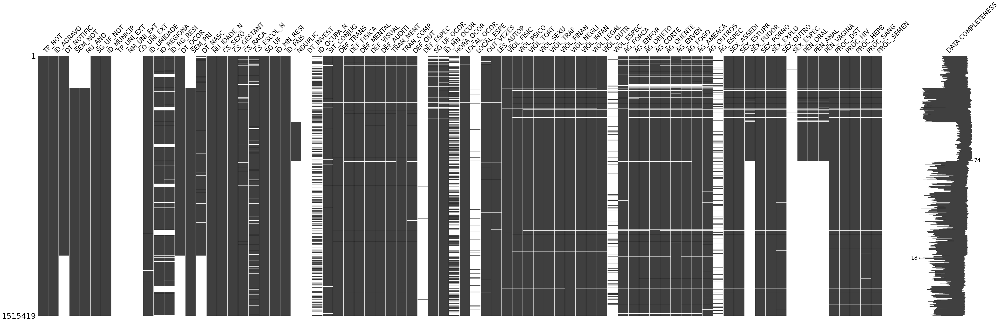

In [5]:
msno.matrix(df.iloc[:, :80], labels=True, fontsize=26, figsize=(70, 20))

<AxesSubplot:>

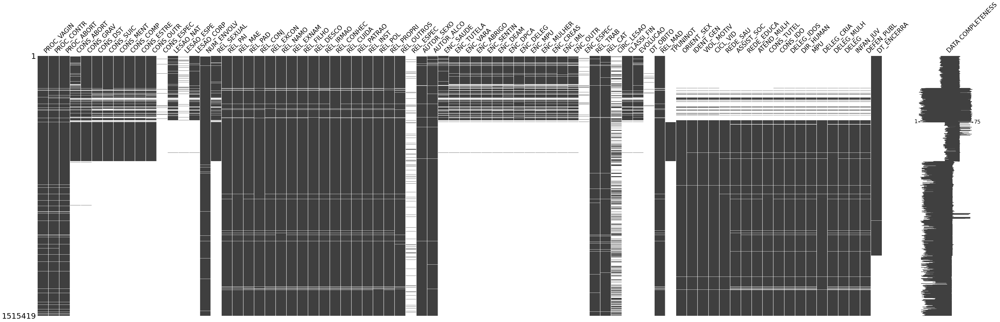

In [6]:
msno.matrix(df.iloc[:, 80:], labels=True, fontsize=26, figsize=(70, 20))

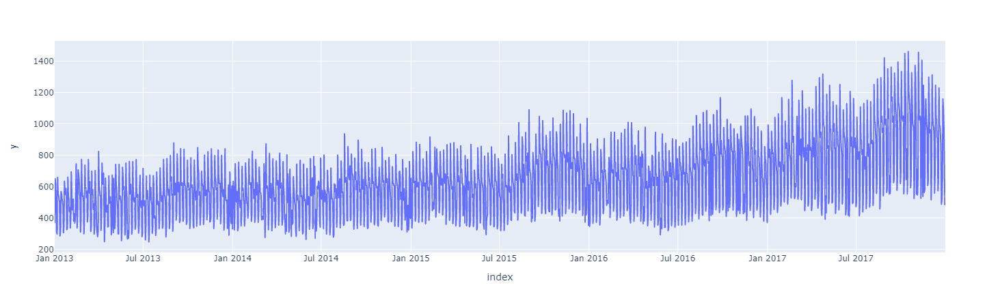

In [7]:
data = df['DT_NOTIFIC'].value_counts().sort_index()
px.line(data, data.index, y=data.values)

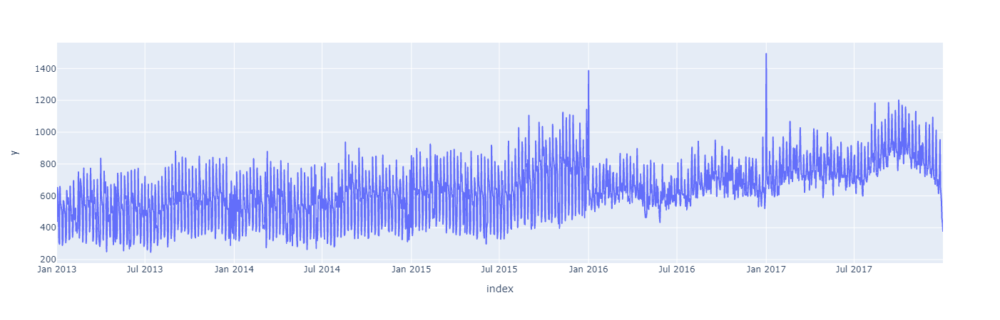

In [8]:
data = df[df['DT_OCOR']>='2013-01-01']['DT_OCOR'].value_counts().sort_index()
px.line(data, data.index, y=data.values)

In [9]:
df['DT_OCOR'].str[:4].value_counts(dropna=False).head(10)

NaN     350308
2017    294404
2016    240804
2015    235704
2014    199549
2013    189617
2010       596
2012       557
2011       409
2009       257
Name: DT_OCOR, dtype: int64

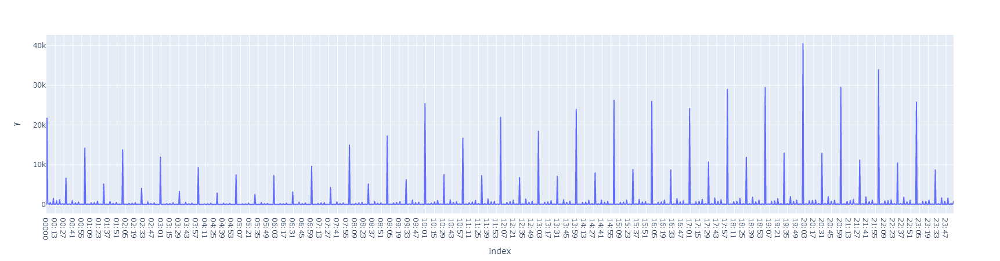

In [10]:
data = df['HORA_OCOR'].value_counts().sort_index()
px.line(data, data.index, y=data.values)

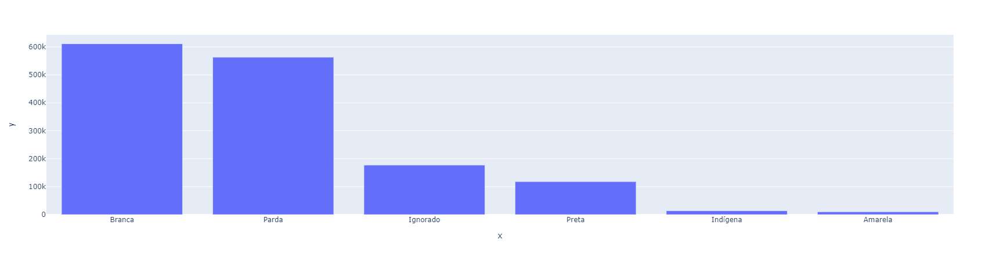

In [11]:
race = {1: 'Branca', 2: 'Preta', 3: 'Amarela', 4: 'Parda', 5: 'Indígena', 9: 'Ignorado'}
df['race'] = df['CS_RACA'].map(race)

data = df['CS_RACA'].map(race).value_counts(dropna=False)
px.bar(x=data.index, y=data.values)

In [35]:
df['race'].value_counts(dropna=False, normalize=True)

Branca      0.403354
Parda       0.371518
Ignorado    0.116775
Preta       0.077850
NaN         0.014875
Indígena    0.009047
Amarela     0.006581
Name: race, dtype: float64

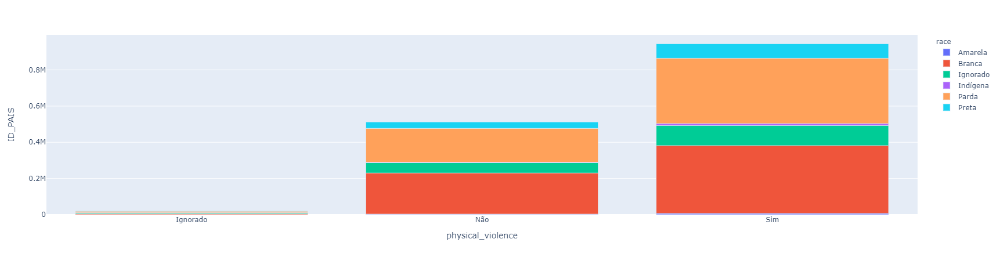

In [12]:
physical_violence = {'1': 'Sim', '1.0': 'Sim', '2': 'Não', '2.0': 'Não', '9': 'Ignorado', '9.0': 'Ignorado'}
df['physical_violence'] = df['VIOL_FISIC'].map(physical_violence)

groupby = df[['physical_violence', 'race', 'ID_PAIS']].groupby(['physical_violence', 'race']).agg('count')
groupby = groupby.reset_index()

px.bar(groupby, x=groupby['physical_violence'], y=groupby['ID_PAIS'], color=groupby['race'])

In [13]:
df['physical_violence'].value_counts()

Sim         960401
Não         517217
Ignorado     20965
Name: physical_violence, dtype: int64

violence = ['VIOL_FISIC', 'VIOL_PSICO', 'VIOL_TORT', 'VIOL_SEXU', 'VIOL_TRAF', 'VIOL_FINAN', 'VIOL_NEGLI', 'VIOL_INFAN', 'VIOL_LEGAL', 'VIOL_OUTR']

for v in violence:
    print(v)
    print(df[v].value_counts(dropna=False))

relationship = ['REL_PAI', 'REL_MAE', 'REL_PAD', 'REL_CONJ', 'REL_EXCON', 'REL_NAMO', 'REL_EXNAM', 'REL_FILHO', 'REL_DESCO', 'REL_IRMAO', 'REL_CONHEC', 'REL_CUIDA', 'REL_PATRAO', 'REL_INST', 'REL_POL', 'REL_PROPRI', 'REL_OUTROS', 'REL_MAD']

#for r in relationship:
    

df['rel'] = df[relationship].apply(lambda row: row[row==1].index, axis=1)

df['rel'].value_counts(dropna=False)

In [14]:
df.head()

,TP_NOT,ID_AGRAVO,DT_NOTIFIC,SEM_NOT,NU_ANO,SG_UF_NOT,ID_MUNICIP,TP_UNI_EXT,NM_UNI_EXT,CO_UNI_EXT,ID_UNIDADE,ID_REGIONA,ID_RG_RESI,DT_OCOR,SEM_PRI,DT_NASC,NU_IDADE_N,CS_SEXO,CS_GESTANT,CS_RACA,CS_ESCOL_N,SG_UF,ID_MN_RESI,ID_PAIS,NDUPLIC,DT_INVEST,ID_OCUPA_N,SIT_CONJUG,DEF_TRANS,DEF_FISICA,DEF_MENTAL,DEF_VISUAL,DEF_AUDITI,TRAN_MENT,TRAN_COMP,DEF_OUT,DEF_ESPEC,SG_UF_OCOR,ID_MN_OCOR,HORA_OCOR,LOCAL_OCOR,LOCAL_ESPE,OUT_VEZES,LES_AUTOP,VIOL_FISIC,VIOL_PSICO,VIOL_TORT,VIOL_SEXU,VIOL_TRAF,VIOL_FINAN,VIOL_NEGLI,VIOL_INFAN,VIOL_LEGAL,VIOL_OUTR,VIOL_ESPEC,AG_FORCA,AG_ENFOR,AG_OBJETO,AG_CORTE,AG_QUENTE,AG_ENVEN,AG_FOGO,AG_AMEACA,AG_OUTROS,AG_ESPEC,SEX_ASSEDI,SEX_ESTUPR,SEX_PUDOR,SEX_PORNO,SEX_EXPLO,SEX_OUTRO,SEX_ESPEC,PEN_ORAL,PEN_ANAL,PEN_VAGINA,PROC_DST,PROC_HIV,PROC_HEPB,PROC_SANG,PROC_SEMEN,PROC_VAGIN,PROC_CONTR,PROC_ABORT,CONS_ABORT,CONS_GRAV,CONS_DST,CONS_SUIC,CONS_MENT,CONS_COMP,CONS_ESTRE,CONS_OUTR,CONS_ESPEC,LESAO_NAT,LESAO_ESPE,LESAO_CORP,NUM_ENVOLV,REL_SEXUAL,REL_PAI,REL_MAE,REL_PAD,REL_CONJ,REL_EXCON,REL_NAMO,REL_EXNAM,REL_FILHO,REL_DESCO,REL_IRMAO,REL_CONHEC,REL_CUIDA,REL_PATRAO,REL_INST,REL_POL,REL_PROPRI,REL_OUTROS,REL_ESPEC,AUTOR_SEXO,AUTOR_ALCO,ENC_SAUDE,ENC_TUTELA,ENC_VARA,ENC_ABRIGO,ENC_SENTIN,ENC_DEAM,ENC_DPCA,ENC_DELEG,ENC_MPU,ENC_MULHER,ENC_CREAS,ENC_IML,ENC_OUTR,ENC_ESPEC,REL_TRAB,REL_CAT,CIRC_LESAO,CLASSI_FIN,EVOLUCAO,DT_OBITO,REL_MAD,TPUNINOT,ORIENT_SEX,IDENT_GEN,VIOL_MOTIV,CICL_VID,REDE_SAU,ASSIST_SOC,REDE_EDUCA,ATEND_MULH,CONS_TUTEL,CONS_IDO,DELEG_IDOS,DIR_HUMAN,MPU,DELEG_CRIA,DELEG_MULH,DELEG,INFAN_JUV,DEFEN_PUBL,DT_ENCERRA,race,physical_violence
0,2,Y09,2013-01-02,NaN,NaN,12,120040,NaN,NaN,NaN,2000733.0,1938.0,1938.0,2013-01-02,NaN,1998-02-09,4014.0,F,5.0,4.0,3.0,12,120040,1.0,NaN,NaN,NaN,2.0,2,8.0,8.0,8.0,8.0,8.0,8.0,8.0,NaN,12.0,120040.0,NaN,1.0,NaN,1.0,1,2,2,2,1,2,2,2,2,2,2,NaN,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,NaN,2,2,2,2,2,2,NaN,2,2,1,2,2,2,2,2,2,2,2,2.0,2,2,2,2,2,2,2,NaN,88.0,NaN,88.0,1.0,1.0,2,2,2,2,2,1,2,2,2,2,2,2,2,2,2,2,2,NaN,1.0,2.0,1.0,1.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,NaN,2.0,8.0,NaN,3.0,1.0,NaN,2,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2013-01-02,Parda,Não
1,2,Y09,2013-01-02,NaN,NaN,12,120040,NaN,NaN,NaN,2000733.0,1938.0,1938.0,2013-01-02,NaN,1998-08-04,4014.0,F,5.0,4.0,3.0,12,120040,1.0,NaN,NaN,999991.0,2.0,2,8.0,8.0,8.0,8.0,8.0,8.0,8.0,NaN,12.0,120040.0,NaN,1.0,NaN,1.0,2,2,2,2,1,2,2,2,2,2,2,NaN,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,NaN,2,2,2,2,2,2,NaN,2,2,1,2,2,2,2,2,2,2,2,2.0,1,2,2,2,2,2,2,NaN,88.0,NaN,88.0,1.0,1.0,2,2,2,2,2,1,2,2,2,2,2,2,2,2,2,2,2,NaN,1.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,NaN,2.0,8.0,NaN,1.0,1.0,NaN,2,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2013-01-02,Parda,Não
2,2,Y09,2013-01-03,NaN,NaN,12,120040,NaN,NaN,NaN,2000733.0,1938.0,1937.0,2013-01-03,NaN,1998-06-22,4014.0,F,2.0,4.0,3.0,12,120017,1.0,NaN,NaN,NaN,2.0,2,8.0,8.0,8.0,8.0,8.0,8.0,8.0,NaN,12.0,120017.0,NaN,1.0,NaN,1.0,2,2,1,2,1,2,2,2,2,2,2,NaN,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,NaN,2,1,2,2,2,2,NaN,2,2,1,2,2,2,1,2,1,2,2,2.0,1,2,2,2,2,2,2,NaN,NaN,NaN,10.0,1.0,1.0,2,2,2,2,2,1,2,2,2,2,2,2,2,2,2,2,2,NaN,1.0,1.0,1.0,1.0,2.0,2.0,2.0,1.0,2.0,2.0,2.0,2.0,2.0,1.0,2.0,NaN,2.0,8.0,NaN,1.0,1.0,NaN,2,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2013-01-03,Parda,Não
3,2,Y09,2013-01-03,NaN,NaN,12,120010,NaN,NaN,NaN,2001500.0,1937.0,1937.0,2013-01-03,NaN,1994-04-03,4018.0,F,5.0,4.0,6.0,12,120010,1.0,NaN,NaN,999991.0,1.0,2,8.0,8.0,8.0,8.0,8.0,8.0,8.0,NaN,12.0,120010.0,23:15,1.0,NaN,2.0,2,1,1,2,2,2,2,2,2,2,2,NaN,1.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,NaN,8,8,8,8,8,8,NaN,8,8,8,8,8,8,8,8,8,8,8,2.0,2,2,2,2,2,2,2,NaN,2.0,NaN,1.0,1.0,1.0,2,2,2,1,2,2,2,2,2,1,2,2,2,2,2,2,2,NaN,1.0,2.0,8.0,2.0,2.0,2.0,2.0,2.0,2.0,1.0,2.0,1.0,1.0,2.0,2.0,NaN,2.0,8.0,Y04.4,1.0,1.0,NaN,2,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2013-01-04,Parda,Sim
4,2,Y09,2013-01-03,NaN,NaN,12,120038,NaN,NaN,NaN,20

In [42]:
df['VIOL_MOTIV'].value_counts(dropna=False)

99.0    400533
NaN     340654
9.0     339453
88.0    199086
6.0      98431
1.0      94802
7.0      24981
8.0      10418
2.0       5064
3.0        744
4.0        719
5.0        534
Name: VIOL_MOTIV, dtype: int64

In [40]:
df['DT_OBITO'].count()

5677

In [41]:
df.shape

(1515419, 166)

# Lat Long Municípios

In [15]:
df_municipios = pd.read_csv('https://github.com/kelvins/Municipios-Brasileiros/raw/main/csv/municipios.csv')

In [16]:
df_municipios.shape

(5570, 6)

In [51]:
df_municipios.head()

,codigo_ibge,nome,latitude,longitude,capital,codigo_uf,ID_MUNICIP
0,5200050,Abadia de Goiás,-16.75730,-49.4412,0,52,520005
1,3100104,Abadia dos Dourados,-18.48310,-47.3916,0,31,310010
2,5200100,Abadiânia,-16.19700,-48.7057,0,52,520010
3,3100203,Abaeté,-19.15510,-45.4444,0,31,310020
4,1500107,Abaetetuba,-1.72183,-48.8788,0,15,150010


In [18]:
df_municipios['ID_MUNICIP'] = df_municipios['codigo_ibge'].astype(str).str[:6].astype('int64')

## Merge

In [19]:
df = df.merge(df_municipios, how='left', left_on=['ID_MUNICIP', 'SG_UF_NOT'], right_on=['ID_MUNICIP', 'codigo_uf'])

In [20]:
df.shape

(1515419, 166)

In [21]:
df['latitude'].value_counts(dropna=False).head()

-23.53290    73725
-22.91290    54420
-25.41950    51968
-20.44860    23794
-8.04666     23246
Name: latitude, dtype: int64

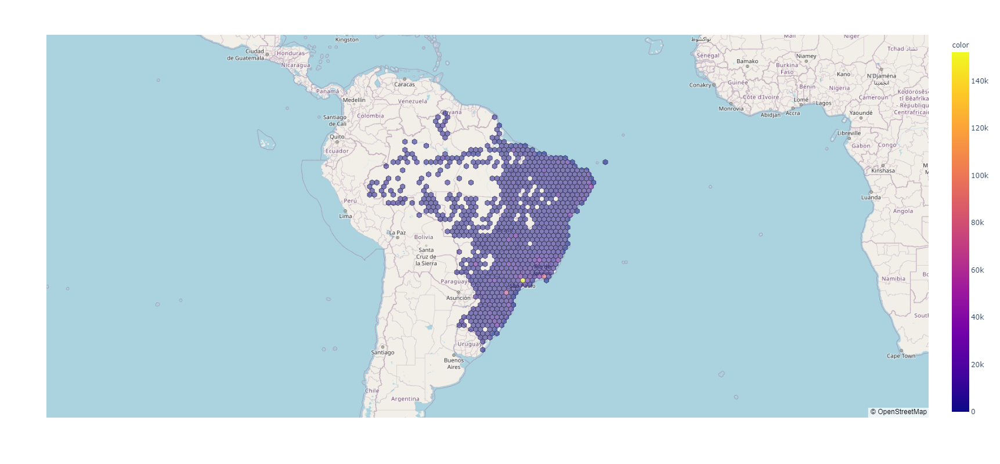

In [33]:
fig = ff.create_hexbin_mapbox(
    data_frame=df,
    lat='latitude',
    lon='longitude',
    nx_hexagon=50,
    min_count=1,
    opacity=0.5
)

fig.update_layout(mapbox_style='open-street-map', height=800)

fig.show()

# Dados administrativos dos municípios

In [23]:
df_ra = pd.read_excel('./../data/raw_data/3. Atlas de Desenvolvimento Humano/Dados_registro_administrativo_total_2013_2017.xlsx', sheet_name='MUNICÍPIO')

In [24]:
df_ra.shape

(27850, 82)

In [25]:
df_ra.head()

,ANO,DESAGREGACAO,IBGE7,NOME,PMATPUB_EF,PMATPUB_EM,PMATPRI_EF,PMATPRI_EM,DIST_EF_TOTAL,DIST_EM_TOTAL,DIST_EF_PRI,DIST_EM_PRI,DIST_EF_PUB,DIST_EM_PUB,TTREVA_EF_TOTAL,TTREVA_EM_TOTAL,TTREVA_EF_PRI,TTREVA_EM_PRI,TTREVA_EF_PUB,TTREVA_EM_PUB,IDEB_AI,IDEB_AF,PMATLINF_EF,PMATLINF_EM,PMATINT_EF,PMATINT_EM,DOCSUP_EF_TOTAL,DOCSUP_EM_TOTAL,DOCSUP_EF_PUB,DOCSUP_EM_PUB,DOCSUP_EF_PRI,DOCSUP_EM_PRI,TXMOINF,TXNASC7C,TXNBAIXOP,TXBRUTAMORT,TXMOHOMI,TXMODCNT,TXMOCANMA,TXMOCANPROST,TXHIV,TXMOATRA,TXMOSUI,TXMOAGR,TXOBITMATERN,TXCOBPLP,TXMAE10A14,TXMAE15A19,PINTERSAP,PINTERDRSAI,REN_PIBPC_D,REN_VAPC_D,REN_PVAAGR,REN_PVAIND,REN_PVAADM,REN_PVASERV,REN_RENSF_D,REN_TRPCBF_D,REN_TRPCBPC_D,PDEFAGUA,PDEFESGOTO,PDEFLIXO,PDEFSAN,PANALF15,PIND_POS,PMPOB_POS,PPOB_POS,PBF,SNIS_PAGUA,SNIS_PESGOTO,SNIS_PESGTRA,SNIS_PCOLSEL,SNIS_CDI,PFOCOS,PFLORA,PFEM_VEREADOR,PFEM_PREFEITO,PFEM_GOVERNADOR,PFEM_DEP_ESTADUAL,PFEM_DEP_FEDERAL,PFEM_SENADOR,POP_TOT
0,2013,TOTAL,1100015,Alta Floresta D&apos;Oeste,99.26,100.00,0.74,NaN,25.8,29.6,NaN,NaN,25.9,29.6,3.4,9.2,3.3,NaN,3.4,9.2,5.4,3.9,48.38,100.00,66.25,100.0,48.1,46.0,47.8,46.0,66.7,NaN,18.324607,64.397906,3.926702,4.353234,15.547264,198.227612,8.078324,14.982177,3.886816,34.981343,7.773632,15.547264,0.000000,12.546642,0.785340,19.895288,40.164900,11.119403,11.10,10.29,34.16,6.27,37.08,22.50,921.94,111.29,118.70,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,67.59,NaN,NaN,NaN,100.0,0.51,66.02,20.00,0.0,NaN,NaN,NaN,NaN,25728
1,2013,TOTAL,1100023,Ariquemes,91.12,94.80,8.88,5.20,24.5,27.1,4.2,3.1,26.3,28.5,3.0,9.1,0.3,1.8,3.2,9.5,4.9,4.2,89.38,92.90,89.27,100.0,57.7,57.9,59.9,57.6,43.3,63.7,11.487304,55.804111,7.799274,4.710227,62.210548,225.142936,9.955455,19.590450,0.987469,45.423575,1.974938,62.210548,60.459492,7.972825,0.725514,21.342201,22.866741,2.586370,14.88,12.96,5.79,22.04,29.00,43.17,1168.11,77.75,152.93,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,41.20,NaN,NaN,NaN,100.0,0.49,34.67,7.69,0.0,NaN,NaN,NaN,NaN,101269
2,2013,TOTAL,1100031,Cabixi,100.00,100.00,NaN,NaN,18.1,18.7,NaN,NaN,18.1,18.7,1.5,6.9,NaN,NaN,1.5,6.9,5.6,4.1,83.74,89.69,100.00,100.0,68.4,64.9,68.4,64.9,NaN,NaN,13.513514,52.702703,6.756757,3.541186,0.000000,230.946882,0.000000,0.000000,0.000000,15.396459,15.396459,NaN,NaN,3.479600,1.351351,13.513514,38.009050,7.641921,12.42,11.59,41.45,3.70,35.58,19.27,1035.36,108.25,74.35,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,56.44,NaN,NaN,NaN,100.0,0.13,32.01,11.11,0.0,NaN,NaN,NaN,NaN,6495
3,2013,TOTAL,1100049,Cacoal,85.55,82.90,14.45,17.10,19.3,24.6,4.2,6.5,21.9,29.4,2.4,9.3,0.3,1.2,2.8,11.4,5.8,4.5,77.93,94.64,80.42,100.0,54.5,56.6,55.4,57.2,49.9,54.4,15.189873,68.776371,6.413502,4.414008,18.634336,270.197873,9.278671,16.372975,19.798982,30.280796,1.164646,17.469690,0.000000,8.680107,0.590717,18.396624,31.855783,3.684514,13.97,12.12,11.02,10.99,31.01,46.97,1228.34,77.67,130.72,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,100.00,55.42,100.0,NaN,100.0,0.13,37.07,8.33,0.0,NaN,NaN,NaN,NaN,85863
4,2013,TOTAL,1100056,Cerejeiras,97.18,97.47,2.82,2.53,21.1,21.1,5.6,NaN,21.5,21.7,2.5,8.5,1.3,0.0,2.6,8.8,6.2,3.6,71.05,97.47,100.00,100.0,71.1,58.3,71.1,58.3,71.4,58.3,11.070111,58.302583,3.690037,5.598359,16.628790,277.146500,0.000000,22.077080,33.257580,60.972230,NaN,16.628790,0.000000,3.486503,1.107011,21.402214,39.698492,15.279188,16.39,13.46,15.17,6.68,27.91,50.24,1147.02,81.75,147.37,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,48.67,NaN,NaN,NaN,NaN,0.19,63.12,0.00,0.0,NaN,NaN,NaN,NaN,18041


In [26]:
df_ra['IBGE6'] = df_ra['IBGE7'].astype(str).str[:6].astype('int64')

In [27]:
df.head()

,TP_NOT,ID_AGRAVO,DT_NOTIFIC,SEM_NOT,NU_ANO,SG_UF_NOT,ID_MUNICIP,TP_UNI_EXT,NM_UNI_EXT,CO_UNI_EXT,ID_UNIDADE,ID_REGIONA,ID_RG_RESI,DT_OCOR,SEM_PRI,DT_NASC,NU_IDADE_N,CS_SEXO,CS_GESTANT,CS_RACA,CS_ESCOL_N,SG_UF,ID_MN_RESI,ID_PAIS,NDUPLIC,DT_INVEST,ID_OCUPA_N,SIT_CONJUG,DEF_TRANS,DEF_FISICA,DEF_MENTAL,DEF_VISUAL,DEF_AUDITI,TRAN_MENT,TRAN_COMP,DEF_OUT,DEF_ESPEC,SG_UF_OCOR,ID_MN_OCOR,HORA_OCOR,LOCAL_OCOR,LOCAL_ESPE,OUT_VEZES,LES_AUTOP,VIOL_FISIC,VIOL_PSICO,VIOL_TORT,VIOL_SEXU,VIOL_TRAF,VIOL_FINAN,VIOL_NEGLI,VIOL_INFAN,VIOL_LEGAL,VIOL_OUTR,VIOL_ESPEC,AG_FORCA,AG_ENFOR,AG_OBJETO,AG_CORTE,AG_QUENTE,AG_ENVEN,AG_FOGO,AG_AMEACA,AG_OUTROS,AG_ESPEC,SEX_ASSEDI,SEX_ESTUPR,SEX_PUDOR,SEX_PORNO,SEX_EXPLO,SEX_OUTRO,SEX_ESPEC,PEN_ORAL,PEN_ANAL,PEN_VAGINA,PROC_DST,PROC_HIV,PROC_HEPB,PROC_SANG,PROC_SEMEN,PROC_VAGIN,PROC_CONTR,PROC_ABORT,CONS_ABORT,CONS_GRAV,CONS_DST,CONS_SUIC,CONS_MENT,CONS_COMP,CONS_ESTRE,CONS_OUTR,CONS_ESPEC,LESAO_NAT,LESAO_ESPE,LESAO_CORP,NUM_ENVOLV,REL_SEXUAL,REL_PAI,REL_MAE,REL_PAD,REL_CONJ,REL_EXCON,REL_NAMO,REL_EXNAM,REL_FILHO,REL_DESCO,REL_IRMAO,REL_CONHEC,REL_CUIDA,REL_PATRAO,REL_INST,REL_POL,REL_PROPRI,REL_OUTROS,REL_ESPEC,AUTOR_SEXO,AUTOR_ALCO,ENC_SAUDE,ENC_TUTELA,ENC_VARA,ENC_ABRIGO,ENC_SENTIN,ENC_DEAM,ENC_DPCA,ENC_DELEG,ENC_MPU,ENC_MULHER,ENC_CREAS,ENC_IML,ENC_OUTR,ENC_ESPEC,REL_TRAB,REL_CAT,CIRC_LESAO,CLASSI_FIN,EVOLUCAO,DT_OBITO,REL_MAD,TPUNINOT,ORIENT_SEX,IDENT_GEN,VIOL_MOTIV,CICL_VID,REDE_SAU,ASSIST_SOC,REDE_EDUCA,ATEND_MULH,CONS_TUTEL,CONS_IDO,DELEG_IDOS,DIR_HUMAN,MPU,DELEG_CRIA,DELEG_MULH,DELEG,INFAN_JUV,DEFEN_PUBL,DT_ENCERRA,race,physical_violence,codigo_ibge,nome,latitude,longitude,capital,codigo_uf
0,2,Y09,2013-01-02,NaN,NaN,12,120040,NaN,NaN,NaN,2000733.0,1938.0,1938.0,2013-01-02,NaN,1998-02-09,4014.0,F,5.0,4.0,3.0,12,120040,1.0,NaN,NaN,NaN,2.0,2,8.0,8.0,8.0,8.0,8.0,8.0,8.0,NaN,12.0,120040.0,NaN,1.0,NaN,1.0,1,2,2,2,1,2,2,2,2,2,2,NaN,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,NaN,2,2,2,2,2,2,NaN,2,2,1,2,2,2,2,2,2,2,2,2.0,2,2,2,2,2,2,2,NaN,88.0,NaN,88.0,1.0,1.0,2,2,2,2,2,1,2,2,2,2,2,2,2,2,2,2,2,NaN,1.0,2.0,1.0,1.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,NaN,2.0,8.0,NaN,3.0,1.0,NaN,2,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2013-01-02,Parda,Não,1200401.0,Rio Branco,-9.97499,-67.8243,1.0,12.0
1,2,Y09,2013-01-02,NaN,NaN,12,120040,NaN,NaN,NaN,2000733.0,1938.0,1938.0,2013-01-02,NaN,1998-08-04,4014.0,F,5.0,4.0,3.0,12,120040,1.0,NaN,NaN,999991.0,2.0,2,8.0,8.0,8.0,8.0,8.0,8.0,8.0,NaN,12.0,120040.0,NaN,1.0,NaN,1.0,2,2,2,2,1,2,2,2,2,2,2,NaN,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,NaN,2,2,2,2,2,2,NaN,2,2,1,2,2,2,2,2,2,2,2,2.0,1,2,2,2,2,2,2,NaN,88.0,NaN,88.0,1.0,1.0,2,2,2,2,2,1,2,2,2,2,2,2,2,2,2,2,2,NaN,1.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,NaN,2.0,8.0,NaN,1.0,1.0,NaN,2,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2013-01-02,Parda,Não,1200401.0,Rio Branco,-9.97499,-67.8243,1.0,12.0
2,2,Y09,2013-01-03,NaN,NaN,12,120040,NaN,NaN,NaN,2000733.0,1938.0,1937.0,2013-01-03,NaN,1998-06-22,4014.0,F,2.0,4.0,3.0,12,120017,1.0,NaN,NaN,NaN,2.0,2,8.0,8.0,8.0,8.0,8.0,8.0,8.0,NaN,12.0,120017.0,NaN,1.0,NaN,1.0,2,2,1,2,1,2,2,2,2,2,2,NaN,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,NaN,2,1,2,2,2,2,NaN,2,2,1,2,2,2,1,2,1,2,2,2.0,1,2,2,2,2,2,2,NaN,NaN,NaN,10.0,1.0,1.0,2,2,2,2,2,1,2,2,2,2,2,2,2,2,2,2,2,NaN,1.0,1.0,1.0,1.0,2.0,2.0,2.0,1.0,2.0,2.0,2.0,2.0,2.0,1.0,2.0,NaN,2.0,8.0,NaN,1.0,1.0,NaN,2,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2013-01-03,Parda,Não,1200401.0,Rio Branco,-9.97499,-67.8243,1.0,12.0
3,2,Y09,2013-01-03,NaN,NaN,12,120010,NaN,NaN,NaN,2001500.0,1937.0,1937.0,2013-01-03,NaN,1994-04-03,4018.0,F,5.0,4.0,6.0,12,120010,1.0,NaN,NaN,999991.0,1.0,2,8.0,8.0,8.0,8.0,8.0,8.0,8.0,NaN,12.0,120010.0,23:15,1.0,NaN,2.0,2,1,1,2,2,2,2,2,2,2,2,NaN,1.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,NaN,8,8,8,8,8,8,NaN,8,8,8,8,8,8,8,8,8,8,8,2.0,2,2,2,2,2,2,2,NaN,2.0,NaN,1.0,1.0,1.0,2,2,2,1,2,2,2,2,2,1,2,2,2,2,2,2,2,NaN,1.0,2.0,8.0,2.0,2.0,2.0,2.0,2.0,2.0,1.0,2.

## Agrupando count de casos por município

In [28]:
groupby = df.groupby(['SG_UF_NOT', 'ID_MUNICIP', 'latitude', 'longitude'])['ID_AGRAVO'].count().reset_index()
groupby.rename(columns={'ID_AGRAVO': 'count'}, inplace=True)

In [29]:
groupby = groupby.merge(df_ra[df_ra['ANO']==2017][['IBGE6', 'POP_TOT']], 
                        how='left', 
                        left_on='ID_MUNICIP', 
                        right_on='IBGE6')

In [30]:
groupby['cases 1k'] = (groupby['count'] * 1000) / groupby['POP_TOT']

In [31]:
groupby.head()

,SG_UF_NOT,ID_MUNICIP,latitude,longitude,count,IBGE6,POP_TOT,cases 1k
0,11,110001,-11.92830,-61.9953,93,110001,25437,3.656092
1,11,110002,-9.90571,-63.0325,348,110002,107345,3.241884
2,11,110003,-13.49450,-60.5520,3,110003,6224,0.482005
3,11,110004,-11.43430,-61.4562,257,110004,88507,2.903725
4,11,110005,-13.18700,-60.8168,51,110005,17934,2.843760


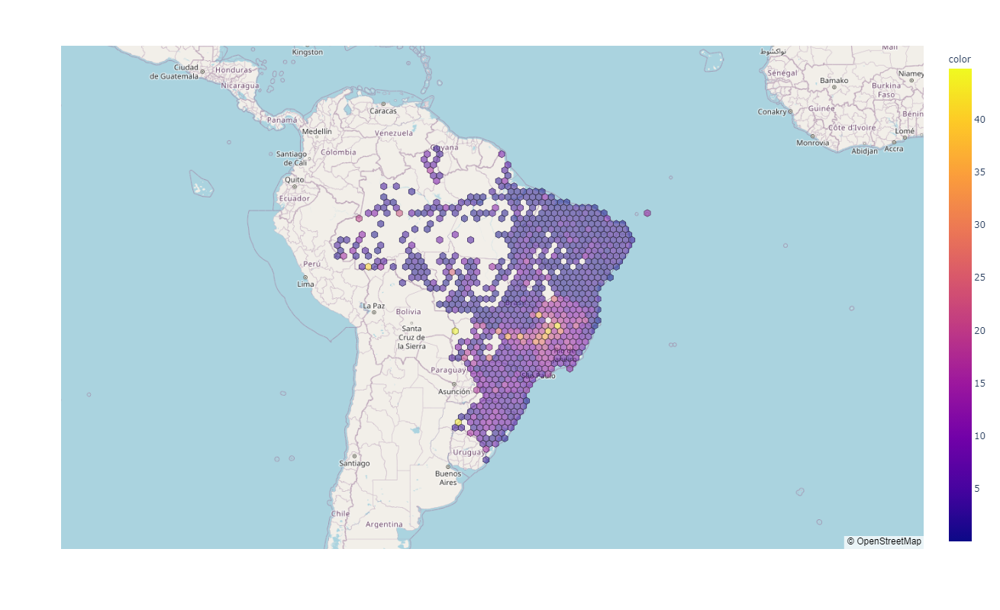

In [86]:
fig = ff.create_hexbin_mapbox(
    data_frame=groupby,
    lat='latitude',
    lon='longitude',
    color='cases 1k',
    nx_hexagon=50,
    min_count=1,
    opacity=0.5
)

fig.update_layout(mapbox_style='open-street-map', height=800)

fig.show()

<AxesSubplot:>

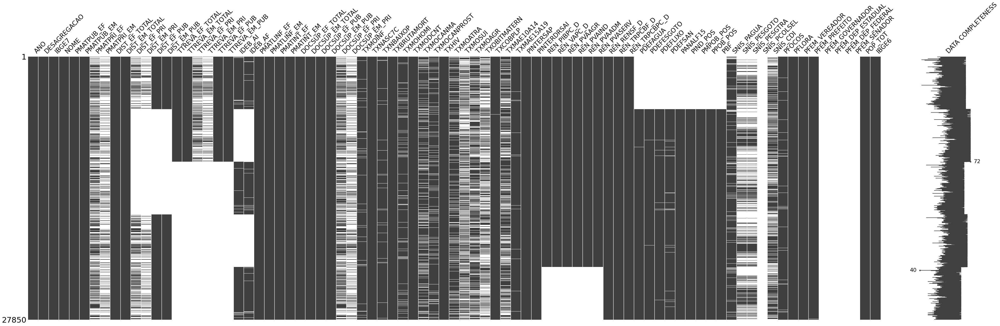

In [74]:
msno.matrix(df_ra, labels=True, fontsize=26, figsize=(70, 20))

# Filtrando dataset

In [141]:
df.shape

(1515419, 166)

In [142]:
df.head()

,TP_NOT,ID_AGRAVO,DT_NOTIFIC,SEM_NOT,NU_ANO,SG_UF_NOT,ID_MUNICIP,TP_UNI_EXT,NM_UNI_EXT,CO_UNI_EXT,ID_UNIDADE,ID_REGIONA,ID_RG_RESI,DT_OCOR,SEM_PRI,DT_NASC,NU_IDADE_N,CS_SEXO,CS_GESTANT,CS_RACA,CS_ESCOL_N,SG_UF,ID_MN_RESI,ID_PAIS,NDUPLIC,DT_INVEST,ID_OCUPA_N,SIT_CONJUG,DEF_TRANS,DEF_FISICA,DEF_MENTAL,DEF_VISUAL,DEF_AUDITI,TRAN_MENT,TRAN_COMP,DEF_OUT,DEF_ESPEC,SG_UF_OCOR,ID_MN_OCOR,HORA_OCOR,LOCAL_OCOR,LOCAL_ESPE,OUT_VEZES,LES_AUTOP,VIOL_FISIC,VIOL_PSICO,VIOL_TORT,VIOL_SEXU,VIOL_TRAF,VIOL_FINAN,VIOL_NEGLI,VIOL_INFAN,VIOL_LEGAL,VIOL_OUTR,VIOL_ESPEC,AG_FORCA,AG_ENFOR,AG_OBJETO,AG_CORTE,AG_QUENTE,AG_ENVEN,AG_FOGO,AG_AMEACA,AG_OUTROS,AG_ESPEC,SEX_ASSEDI,SEX_ESTUPR,SEX_PUDOR,SEX_PORNO,SEX_EXPLO,SEX_OUTRO,SEX_ESPEC,PEN_ORAL,PEN_ANAL,PEN_VAGINA,PROC_DST,PROC_HIV,PROC_HEPB,PROC_SANG,PROC_SEMEN,PROC_VAGIN,PROC_CONTR,PROC_ABORT,CONS_ABORT,CONS_GRAV,CONS_DST,CONS_SUIC,CONS_MENT,CONS_COMP,CONS_ESTRE,CONS_OUTR,CONS_ESPEC,LESAO_NAT,LESAO_ESPE,LESAO_CORP,NUM_ENVOLV,REL_SEXUAL,REL_PAI,REL_MAE,REL_PAD,REL_CONJ,REL_EXCON,REL_NAMO,REL_EXNAM,REL_FILHO,REL_DESCO,REL_IRMAO,REL_CONHEC,REL_CUIDA,REL_PATRAO,REL_INST,REL_POL,REL_PROPRI,REL_OUTROS,REL_ESPEC,AUTOR_SEXO,AUTOR_ALCO,ENC_SAUDE,ENC_TUTELA,ENC_VARA,ENC_ABRIGO,ENC_SENTIN,ENC_DEAM,ENC_DPCA,ENC_DELEG,ENC_MPU,ENC_MULHER,ENC_CREAS,ENC_IML,ENC_OUTR,ENC_ESPEC,REL_TRAB,REL_CAT,CIRC_LESAO,CLASSI_FIN,EVOLUCAO,DT_OBITO,REL_MAD,TPUNINOT,ORIENT_SEX,IDENT_GEN,VIOL_MOTIV,CICL_VID,REDE_SAU,ASSIST_SOC,REDE_EDUCA,ATEND_MULH,CONS_TUTEL,CONS_IDO,DELEG_IDOS,DIR_HUMAN,MPU,DELEG_CRIA,DELEG_MULH,DELEG,INFAN_JUV,DEFEN_PUBL,DT_ENCERRA,race,physical_violence,codigo_ibge,nome,latitude,longitude,capital,codigo_uf
0,2,Y09,2013-01-02,NaN,NaN,12,120040,NaN,NaN,NaN,2000733.0,1938.0,1938.0,2013-01-02,NaN,1998-02-09,4014.0,F,5.0,4.0,3.0,12,120040,1.0,NaN,NaN,NaN,2.0,2,8.0,8.0,8.0,8.0,8.0,8.0,8.0,NaN,12.0,120040.0,NaN,1.0,NaN,1.0,1,2,2,2,1,2,2,2,2,2,2,NaN,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,NaN,2,2,2,2,2,2,NaN,2,2,1,2,2,2,2,2,2,2,2,2.0,2,2,2,2,2,2,2,NaN,88.0,NaN,88.0,1.0,1.0,2,2,2,2,2,1,2,2,2,2,2,2,2,2,2,2,2,NaN,1.0,2.0,1.0,1.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,NaN,2.0,8.0,NaN,3.0,1.0,NaN,2,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2013-01-02,Parda,Não,1200401.0,Rio Branco,-9.97499,-67.8243,1.0,12.0
1,2,Y09,2013-01-02,NaN,NaN,12,120040,NaN,NaN,NaN,2000733.0,1938.0,1938.0,2013-01-02,NaN,1998-08-04,4014.0,F,5.0,4.0,3.0,12,120040,1.0,NaN,NaN,999991.0,2.0,2,8.0,8.0,8.0,8.0,8.0,8.0,8.0,NaN,12.0,120040.0,NaN,1.0,NaN,1.0,2,2,2,2,1,2,2,2,2,2,2,NaN,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,NaN,2,2,2,2,2,2,NaN,2,2,1,2,2,2,2,2,2,2,2,2.0,1,2,2,2,2,2,2,NaN,88.0,NaN,88.0,1.0,1.0,2,2,2,2,2,1,2,2,2,2,2,2,2,2,2,2,2,NaN,1.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,NaN,2.0,8.0,NaN,1.0,1.0,NaN,2,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2013-01-02,Parda,Não,1200401.0,Rio Branco,-9.97499,-67.8243,1.0,12.0
2,2,Y09,2013-01-03,NaN,NaN,12,120040,NaN,NaN,NaN,2000733.0,1938.0,1937.0,2013-01-03,NaN,1998-06-22,4014.0,F,2.0,4.0,3.0,12,120017,1.0,NaN,NaN,NaN,2.0,2,8.0,8.0,8.0,8.0,8.0,8.0,8.0,NaN,12.0,120017.0,NaN,1.0,NaN,1.0,2,2,1,2,1,2,2,2,2,2,2,NaN,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,NaN,2,1,2,2,2,2,NaN,2,2,1,2,2,2,1,2,1,2,2,2.0,1,2,2,2,2,2,2,NaN,NaN,NaN,10.0,1.0,1.0,2,2,2,2,2,1,2,2,2,2,2,2,2,2,2,2,2,NaN,1.0,1.0,1.0,1.0,2.0,2.0,2.0,1.0,2.0,2.0,2.0,2.0,2.0,1.0,2.0,NaN,2.0,8.0,NaN,1.0,1.0,NaN,2,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2013-01-03,Parda,Não,1200401.0,Rio Branco,-9.97499,-67.8243,1.0,12.0
3,2,Y09,2013-01-03,NaN,NaN,12,120010,NaN,NaN,NaN,2001500.0,1937.0,1937.0,2013-01-03,NaN,1994-04-03,4018.0,F,5.0,4.0,6.0,12,120010,1.0,NaN,NaN,999991.0,1.0,2,8.0,8.0,8.0,8.0,8.0,8.0,8.0,NaN,12.0,120010.0,23:15,1.0,NaN,2.0,2,1,1,2,2,2,2,2,2,2,2,NaN,1.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,NaN,8,8,8,8,8,8,NaN,8,8,8,8,8,8,8,8,8,8,8,2.0,2,2,2,2,2,2,2,NaN,2.0,NaN,1.0,1.0,1.0,2,2,2,1,2,2,2,2,2,1,2,2,2,2,2,2,2,NaN,1.0,2.0,8.0,2.0,2.0,2.0,2.0,2.0,2.0,1.0,2.

In [143]:
df_f = df[(df['CS_SEXO']=='F') & 
        ((df['VIOL_FISIC']=='1') | (df['VIOL_PSICO']=='1') | (df['VIOL_SEXU']=='1') | (df['VIOL_FINAN']=='1')) &
        ((df['REL_SEXUAL']=='1.0') | (df['REL_PAI']=='1.0') | (df['REL_MAE']=='1.0') | (df['REL_PAD']=='1.0') | (df['REL_CONJ']=='1.0') | (df['REL_EXCON']=='1.0') | 
         (df['REL_NAMO']=='1.0') | (df['REL_EXNAM']=='1.0') | (df['REL_FILHO']=='1.0') | (df['REL_IRMAO']=='1.0') | (df['REL_CONHEC']=='1.0') | (df['REL_EXNAM']=='1.0'))]

In [144]:
df_f.shape

(116952, 166)

In [173]:
df_f.head()

,TP_NOT,ID_AGRAVO,DT_NOTIFIC,SEM_NOT,NU_ANO,SG_UF_NOT,ID_MUNICIP,TP_UNI_EXT,NM_UNI_EXT,CO_UNI_EXT,ID_UNIDADE,ID_REGIONA,ID_RG_RESI,DT_OCOR,SEM_PRI,DT_NASC,NU_IDADE_N,CS_SEXO,CS_GESTANT,CS_RACA,CS_ESCOL_N,SG_UF,ID_MN_RESI,ID_PAIS,NDUPLIC,DT_INVEST,ID_OCUPA_N,SIT_CONJUG,DEF_TRANS,DEF_FISICA,DEF_MENTAL,DEF_VISUAL,DEF_AUDITI,TRAN_MENT,TRAN_COMP,DEF_OUT,DEF_ESPEC,SG_UF_OCOR,ID_MN_OCOR,HORA_OCOR,LOCAL_OCOR,LOCAL_ESPE,OUT_VEZES,LES_AUTOP,VIOL_FISIC,VIOL_PSICO,VIOL_TORT,VIOL_SEXU,VIOL_TRAF,VIOL_FINAN,VIOL_NEGLI,VIOL_INFAN,VIOL_LEGAL,VIOL_OUTR,VIOL_ESPEC,AG_FORCA,AG_ENFOR,AG_OBJETO,AG_CORTE,AG_QUENTE,AG_ENVEN,AG_FOGO,AG_AMEACA,AG_OUTROS,AG_ESPEC,SEX_ASSEDI,SEX_ESTUPR,SEX_PUDOR,SEX_PORNO,SEX_EXPLO,SEX_OUTRO,SEX_ESPEC,PEN_ORAL,PEN_ANAL,PEN_VAGINA,PROC_DST,PROC_HIV,PROC_HEPB,PROC_SANG,PROC_SEMEN,PROC_VAGIN,PROC_CONTR,PROC_ABORT,CONS_ABORT,CONS_GRAV,CONS_DST,CONS_SUIC,CONS_MENT,CONS_COMP,CONS_ESTRE,CONS_OUTR,CONS_ESPEC,LESAO_NAT,LESAO_ESPE,LESAO_CORP,NUM_ENVOLV,REL_SEXUAL,REL_PAI,REL_MAE,REL_PAD,REL_CONJ,REL_EXCON,REL_NAMO,REL_EXNAM,REL_FILHO,REL_DESCO,REL_IRMAO,REL_CONHEC,REL_CUIDA,REL_PATRAO,REL_INST,REL_POL,REL_PROPRI,REL_OUTROS,REL_ESPEC,AUTOR_SEXO,AUTOR_ALCO,ENC_SAUDE,ENC_TUTELA,ENC_VARA,ENC_ABRIGO,ENC_SENTIN,ENC_DEAM,ENC_DPCA,ENC_DELEG,ENC_MPU,ENC_MULHER,ENC_CREAS,ENC_IML,ENC_OUTR,ENC_ESPEC,REL_TRAB,REL_CAT,CIRC_LESAO,CLASSI_FIN,EVOLUCAO,DT_OBITO,REL_MAD,TPUNINOT,ORIENT_SEX,IDENT_GEN,VIOL_MOTIV,CICL_VID,REDE_SAU,ASSIST_SOC,REDE_EDUCA,ATEND_MULH,CONS_TUTEL,CONS_IDO,DELEG_IDOS,DIR_HUMAN,MPU,DELEG_CRIA,DELEG_MULH,DELEG,INFAN_JUV,DEFEN_PUBL,DT_ENCERRA,race,physical_violence,codigo_ibge,nome,latitude,longitude,capital,codigo_uf,COD_UF,NOME_UF,SIGLA_UF
0,2,Y09,2013-01-02,NaN,NaN,12,120040,NaN,NaN,NaN,2000733.0,1938.0,1938.0,2013-01-02,NaN,1998-02-09,4014.0,F,5.0,4.0,3.0,12,120040,1.0,NaN,NaN,NaN,2.0,2,8.0,8.0,8.0,8.0,8.0,8.0,8.0,NaN,12.0,120040.0,NaN,1.0,NaN,1.0,1,2,2,2,1,2,2,2,2,2,2,NaN,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,NaN,2,2,2,2,2,2,NaN,2,2,1,2,2,2,2,2,2,2,2,2.0,2,2,2,2,2,2,2,NaN,88.0,NaN,88.0,1.0,1.0,2,2,2,2,2,1,2,2,2,2,2,2,2,2,2,2,2,NaN,1.0,2.0,1.0,1.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,NaN,2.0,8.0,NaN,3.0,1.0,NaN,2,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2013-01-02,Parda,Não,1200401.0,Rio Branco,-9.97499,-67.8243,1.0,12.0,12,Acre,AC
1,2,Y09,2013-01-02,NaN,NaN,12,120040,NaN,NaN,NaN,2000733.0,1938.0,1938.0,2013-01-02,NaN,1998-08-04,4014.0,F,5.0,4.0,3.0,12,120040,1.0,NaN,NaN,999991.0,2.0,2,8.0,8.0,8.0,8.0,8.0,8.0,8.0,NaN,12.0,120040.0,NaN,1.0,NaN,1.0,2,2,2,2,1,2,2,2,2,2,2,NaN,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,NaN,2,2,2,2,2,2,NaN,2,2,1,2,2,2,2,2,2,2,2,2.0,1,2,2,2,2,2,2,NaN,88.0,NaN,88.0,1.0,1.0,2,2,2,2,2,1,2,2,2,2,2,2,2,2,2,2,2,NaN,1.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,NaN,2.0,8.0,NaN,1.0,1.0,NaN,2,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2013-01-02,Parda,Não,1200401.0,Rio Branco,-9.97499,-67.8243,1.0,12.0,12,Acre,AC
2,2,Y09,2013-01-03,NaN,NaN,12,120040,NaN,NaN,NaN,2000733.0,1938.0,1937.0,2013-01-03,NaN,1998-06-22,4014.0,F,2.0,4.0,3.0,12,120017,1.0,NaN,NaN,NaN,2.0,2,8.0,8.0,8.0,8.0,8.0,8.0,8.0,NaN,12.0,120017.0,NaN,1.0,NaN,1.0,2,2,1,2,1,2,2,2,2,2,2,NaN,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,NaN,2,1,2,2,2,2,NaN,2,2,1,2,2,2,1,2,1,2,2,2.0,1,2,2,2,2,2,2,NaN,NaN,NaN,10.0,1.0,1.0,2,2,2,2,2,1,2,2,2,2,2,2,2,2,2,2,2,NaN,1.0,1.0,1.0,1.0,2.0,2.0,2.0,1.0,2.0,2.0,2.0,2.0,2.0,1.0,2.0,NaN,2.0,8.0,NaN,1.0,1.0,NaN,2,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2013-01-03,Parda,Não,1200401.0,Rio Branco,-9.97499,-67.8243,1.0,12.0,12,Acre,AC
3,2,Y09,2013-01-03,NaN,NaN,12,120010,NaN,NaN,NaN,2001500.0,1937.0,1937.0,2013-01-03,NaN,1994-04-03,4018.0,F,5.0,4.0,6.0,12,120010,1.0,NaN,NaN,999991.0,1.0,2,8.0,8.0,8.0,8.0,8.0,8.0,8.0,NaN,12.0,120010.0,23:15,1.0,NaN,2.0,2,1,1,2,2,2,2,2,2,2,2,NaN,1.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,NaN,8,8,8,8,8,8,NaN,8,8,8,8,8,8,8,8,8,8,8,2.0,2,2,2,2,2,2,2,NaN,2.0,NaN,1.0,1.0,1.0,2,2,2,1,2,2,2,2,2,1,2,2

In [145]:
groupby = df_f.groupby(['SG_UF_NOT', 'ID_MUNICIP', 'latitude', 'longitude'])['ID_AGRAVO'].count().reset_index()
groupby.rename(columns={'ID_AGRAVO': 'count'}, inplace=True)

In [146]:
groupby = groupby.merge(df_ra[df_ra['ANO']==2017][['IBGE6', 'POP_TOT']], 
                        how='left', 
                        left_on='ID_MUNICIP', 
                        right_on='IBGE6')

In [147]:
groupby['cases 1k'] = (groupby['count'] * 1000) / groupby['POP_TOT']

In [148]:
groupby.head()

,SG_UF_NOT,ID_MUNICIP,latitude,longitude,count,IBGE6,POP_TOT,cases 1k
0,11,110001,-11.92830,-61.9953,61,110001,25437,2.398082
1,11,110002,-9.90571,-63.0325,115,110002,107345,1.071312
2,11,110003,-13.49450,-60.5520,2,110003,6224,0.321337
3,11,110004,-11.43430,-61.4562,79,110004,88507,0.892585
4,11,110005,-13.18700,-60.8168,11,110005,17934,0.613360


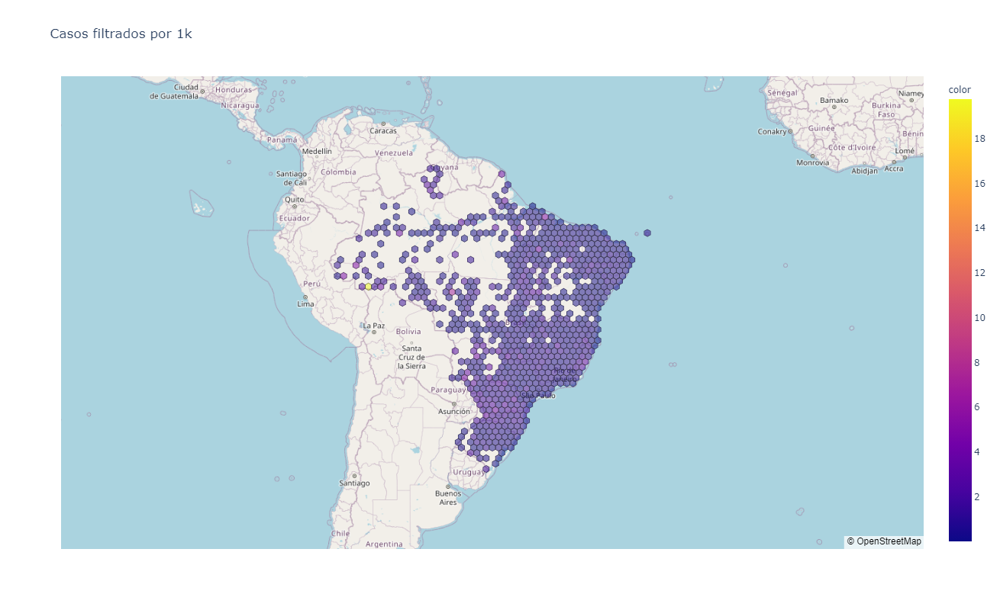

In [149]:
fig = ff.create_hexbin_mapbox(
    data_frame=groupby,
    lat='latitude',
    lon='longitude',
    color='cases 1k',
    nx_hexagon=50,
    min_count=1,
    opacity=0.5,
    title='Casos filtrados por 1k',
    #color_continuous_scale='cividis'
)

fig.update_layout(mapbox_style='open-street-map', height=800)

fig.show()

In [150]:
df_f['nome'].value_counts(dropna=False, normalize=True).head(20)

Belém           0.032210
Curitiba        0.031654
Recife          0.024412
Fortaleza       0.016502
Vitória         0.014784
Londrina        0.011347
Rio Branco      0.010876
Serra           0.010603
Campo Grande    0.009064
Palmas          0.008687
Brasiléia       0.008602
Santarém        0.008149
Tucuruí         0.007704
Aracruz         0.007584
Maceió          0.007379
João Pessoa     0.007276
Altamira        0.006849
Goiânia         0.006712
São José        0.006695
Caxias          0.006687
Name: nome, dtype: float64

In [151]:
df_f['SG_UF_NOT'].value_counts(dropna=False).head(10)

41    18477
42    10647
35     9934
26     9282
31     8723
15     8588
32     8315
23     3992
43     3637
12     3492
Name: SG_UF_NOT, dtype: int64

In [152]:
df_uf = pd.read_csv('https://github.com/leogermani/estados-e-municipios-ibge/raw/master/estados.csv', )
df_uf.rename(columns={'COD': 'COD_UF', 'NOME': 'NOME_UF', 'SIGLA': 'SIGLA_UF'}, inplace=True)
df_uf.head()

,COD_UF,NOME_UF,SIGLA_UF
0,35,São Paulo,SP
1,41,Paraná,PR
2,42,Santa Catarina,SC
3,43,Rio Grande do Sul,RS
4,50,Mato Grosso do Sul,MS


In [153]:
df_f = df_f.merge(df_uf, how='left', left_on='SG_UF_NOT', right_on='COD_UF')

In [154]:
df_f['SIGLA_UF'].value_counts(dropna=False, normalize=True).head(10)

 PR    0.157988
 SC    0.091037
 SP    0.084941
 PE    0.079366
 MG    0.074586
 PA    0.073432
 ES    0.071098
 CE    0.034134
 RS    0.031098
 AC    0.029858
Name: SIGLA_UF, dtype: float64

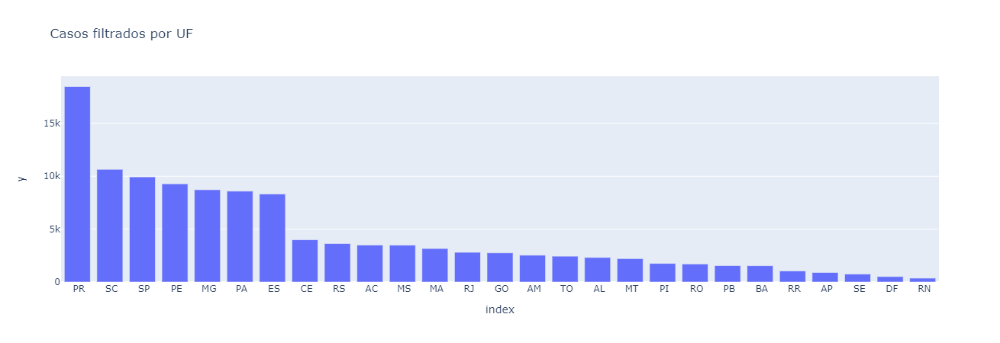

In [155]:
data = df_f['SIGLA_UF'].value_counts(dropna=False)

fig = px.bar(data, x=data.index, y=data.values, title='Casos filtrados por UF')
fig.show()

In [160]:
df_ra.head()

,ANO,DESAGREGACAO,IBGE7,NOME,PMATPUB_EF,PMATPUB_EM,PMATPRI_EF,PMATPRI_EM,DIST_EF_TOTAL,DIST_EM_TOTAL,DIST_EF_PRI,DIST_EM_PRI,DIST_EF_PUB,DIST_EM_PUB,TTREVA_EF_TOTAL,TTREVA_EM_TOTAL,TTREVA_EF_PRI,TTREVA_EM_PRI,TTREVA_EF_PUB,TTREVA_EM_PUB,IDEB_AI,IDEB_AF,PMATLINF_EF,PMATLINF_EM,PMATINT_EF,PMATINT_EM,DOCSUP_EF_TOTAL,DOCSUP_EM_TOTAL,DOCSUP_EF_PUB,DOCSUP_EM_PUB,DOCSUP_EF_PRI,DOCSUP_EM_PRI,TXMOINF,TXNASC7C,TXNBAIXOP,TXBRUTAMORT,TXMOHOMI,TXMODCNT,TXMOCANMA,TXMOCANPROST,TXHIV,TXMOATRA,TXMOSUI,TXMOAGR,TXOBITMATERN,TXCOBPLP,TXMAE10A14,TXMAE15A19,PINTERSAP,PINTERDRSAI,REN_PIBPC_D,REN_VAPC_D,REN_PVAAGR,REN_PVAIND,REN_PVAADM,REN_PVASERV,REN_RENSF_D,REN_TRPCBF_D,REN_TRPCBPC_D,PDEFAGUA,PDEFESGOTO,PDEFLIXO,PDEFSAN,PANALF15,PIND_POS,PMPOB_POS,PPOB_POS,PBF,SNIS_PAGUA,SNIS_PESGOTO,SNIS_PESGTRA,SNIS_PCOLSEL,SNIS_CDI,PFOCOS,PFLORA,PFEM_VEREADOR,PFEM_PREFEITO,PFEM_GOVERNADOR,PFEM_DEP_ESTADUAL,PFEM_DEP_FEDERAL,PFEM_SENADOR,POP_TOT,IBGE6,codigo_ibge,nome,latitude,longitude,capital,codigo_uf,ID_MUNICIP,COD_UF,NOME_UF,SIGLA_UF
0,2013,TOTAL,1100015,Alta Floresta D&apos;Oeste,99.26,100.00,0.74,NaN,25.8,29.6,NaN,NaN,25.9,29.6,3.4,9.2,3.3,NaN,3.4,9.2,5.4,3.9,48.38,100.00,66.25,100.0,48.1,46.0,47.8,46.0,66.7,NaN,18.324607,64.397906,3.926702,4.353234,15.547264,198.227612,8.078324,14.982177,3.886816,34.981343,7.773632,15.547264,0.000000,12.546642,0.785340,19.895288,40.164900,11.119403,11.10,10.29,34.16,6.27,37.08,22.50,921.94,111.29,118.70,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,67.59,NaN,NaN,NaN,100.0,0.51,66.02,20.00,0.0,NaN,NaN,NaN,NaN,25728,110001,1100015,Alta Floresta D'Oeste,-11.92830,-61.9953,0,11,110001,11,Rondônia,RO
1,2013,TOTAL,1100023,Ariquemes,91.12,94.80,8.88,5.20,24.5,27.1,4.2,3.1,26.3,28.5,3.0,9.1,0.3,1.8,3.2,9.5,4.9,4.2,89.38,92.90,89.27,100.0,57.7,57.9,59.9,57.6,43.3,63.7,11.487304,55.804111,7.799274,4.710227,62.210548,225.142936,9.955455,19.590450,0.987469,45.423575,1.974938,62.210548,60.459492,7.972825,0.725514,21.342201,22.866741,2.586370,14.88,12.96,5.79,22.04,29.00,43.17,1168.11,77.75,152.93,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,41.20,NaN,NaN,NaN,100.0,0.49,34.67,7.69,0.0,NaN,NaN,NaN,NaN,101269,110002,1100023,Ariquemes,-9.90571,-63.0325,0,11,110002,11,Rondônia,RO
2,2013,TOTAL,1100031,Cabixi,100.00,100.00,NaN,NaN,18.1,18.7,NaN,NaN,18.1,18.7,1.5,6.9,NaN,NaN,1.5,6.9,5.6,4.1,83.74,89.69,100.00,100.0,68.4,64.9,68.4,64.9,NaN,NaN,13.513514,52.702703,6.756757,3.541186,0.000000,230.946882,0.000000,0.000000,0.000000,15.396459,15.396459,NaN,NaN,3.479600,1.351351,13.513514,38.009050,7.641921,12.42,11.59,41.45,3.70,35.58,19.27,1035.36,108.25,74.35,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,56.44,NaN,NaN,NaN,100.0,0.13,32.01,11.11,0.0,NaN,NaN,NaN,NaN,6495,110003,1100031,Cabixi,-13.49450,-60.5520,0,11,110003,11,Rondônia,RO
3,2013,TOTAL,1100049,Cacoal,85.55,82.90,14.45,17.10,19.3,24.6,4.2,6.5,21.9,29.4,2.4,9.3,0.3,1.2,2.8,11.4,5.8,4.5,77.93,94.64,80.42,100.0,54.5,56.6,55.4,57.2,49.9,54.4,15.189873,68.776371,6.413502,4.414008,18.634336,270.197873,9.278671,16.372975,19.798982,30.280796,1.164646,17.469690,0.000000,8.680107,0.590717,18.396624,31.855783,3.684514,13.97,12.12,11.02,10.99,31.01,46.97,1228.34,77.67,130.72,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,100.00,55.42,100.0,NaN,100.0,0.13,37.07,8.33,0.0,NaN,NaN,NaN,NaN,85863,110004,1100049,Cacoal,-11.43430,-61.4562,0,11,110004,11,Rondônia,RO
4,2013,TOTAL,1100056,Cerejeiras,97.18,97.47,2.82,2.53,21.1,21.1,5.6,NaN,21.5,21.7,2.5,8.5,1.3,0.0,2.6,8.8,6.2,3.6,71.05,97.47,100.00,100.0,71.1,58.3,71.1,58.3,71.4,58.3,11.070111,58.302583,3.690037,5.598359,16.628790,277.146500,0.000000,22.077080,33.257580,60.972230,NaN,16.628790,0.000000,3.486503,1.107011,21.402214,39.698492,15.279188,16.39,13.46,15.17,6.68,27.91,50.24,1147.02,81.75,147.37,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,48.67,NaN,NaN,NaN,NaN,0.19,63.12,0.00,0.0,NaN,NaN,NaN,NaN,18041,110005,1100056,Cerejeiras,-13.18700,-60.8168,0,11,110005,11,Rondônia,RO


In [157]:
df_ra = df_ra.merge(df_municipios, how='left', left_on=['IBGE6'], right_on=['ID_MUNICIP'])

In [159]:
df_ra = df_ra.merge(df_uf, how='left', left_on='codigo_uf', right_on='COD_UF')

<AxesSubplot:>

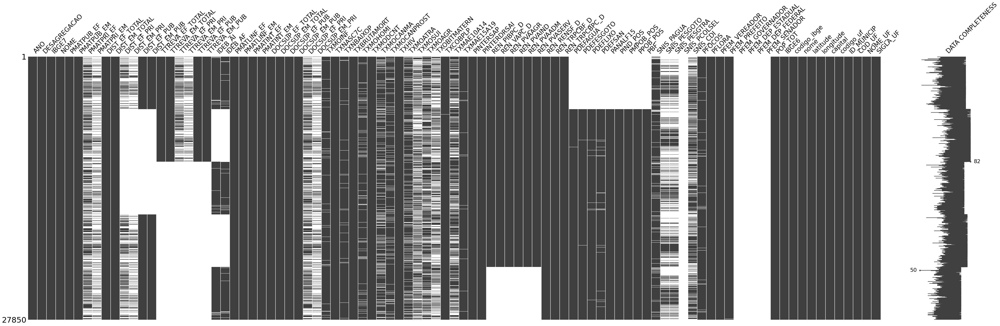

In [161]:
msno.matrix(df_ra, labels=True, fontsize=26, figsize=(70, 20))

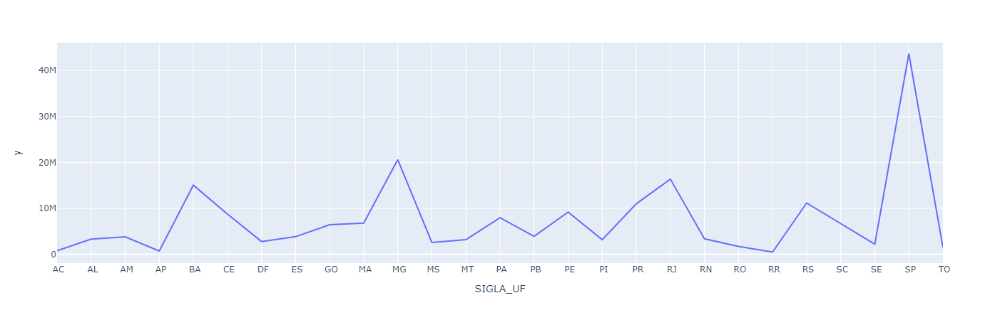

In [191]:
data = df_ra[df_ra['ANO']==2013].groupby('SIGLA_UF')['POP_TOT'].sum()
data = data.sort_index()#.sort_values(ascending=False)

fig = px.line(data, x=data.index, y=data.values)
fig.show()

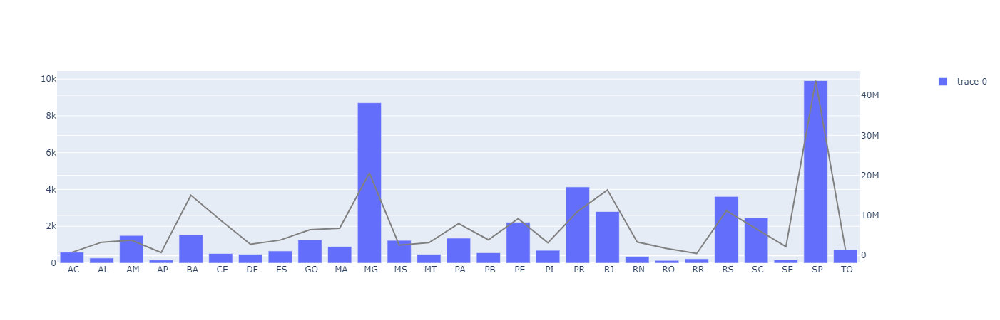

In [188]:
from plotly.subplots import make_subplots

data = df_f[df_f['DT_OCOR'].str[:4]=='2013']['SIGLA_UF'].value_counts(dropna=False)
data = data.sort_index()

fig = go.Figure()
fig = make_subplots(specs=[[{'secondary_y': True}]])

fig.add_trace(go.Bar(x=data.index, y=data.values))

data = df_ra[df_ra['ANO']==2013].groupby('SIGLA_UF')['POP_TOT'].sum().sort_index()
fig.add_trace(
    go.Scatter(
        x=data.index,
        y=data.values,
        mode="lines",
        line=go.scatter.Line(color="gray"),
        showlegend=False),
    secondary_y=True
)

fig.show()